# Recurrence Analysis

[original code](https://github.com/JuliaDynamics/JuliaDynamics/blob/master/tutorials/Youtube_JuliaLang_tutorial/5.%20RecurrenceAnalysis.ipynb)

[video tutorial](https://www.youtube.com/watch?v=A8g9rdEfdNg)

A. What is Recurrence matrix

B. Recurrence Plots

C. Typical Recurrence plots

D. Using Recurrence matrix

# A. What is a Recurrence matrix?

Many interesting dynamical systems evolve with a bounded set, i.e all the trajectories move around in a specific region of space instead of escaping to infinity.

In such cases a **recurrence** is an event likely to happen. Recurrence simply that a trajectory $x(t_{i})$ visits its neighborhood of itself at a another point of time $x(t_{j})$. A **recurrence matrix** is a way to list these recurrences

To put it into more concrete terms, teh recurrence matrix is defined as 

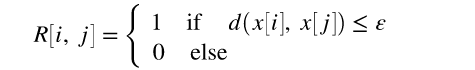

$d(x[i], x[j])$ is the distance between the two points at times $i,j$ . We can use different metrics for $d$ and by default we will use Euclidean.

Notice that $x$ can be single timeseries or a full trajectory.

IN the previous examples we have been looking at the Lorentz system in different regimes. LEts see how the recurrence matrix of the lorentz system looks like

In [1]:
using DynamicalSystems, Plots

In [3]:
lor = Systems.lorenz()

3-dimensional continuous dynamical system
 state:       [0.0, 10.0, 0.0]
 e.o.m.:      loop
 in-place?    false
 jacobian:    loop_jac
 parameters:  [10.0, 28.0, 2.6666666666666665]

 To create a recurrence matrix simply use `RecurrenceMatrix(trajectory,ε)` with ε the distance  threshold

In [4]:
set_parameter!(lor, 2, 69.75) # stable regime for lorentz

t = 5.0
dt = 0.01
tr = trajectory(lor, t; dt=dt, Ttr=2000.0)

R = RecurrenceMatrix(tr, 5.0)

        RecurrenceMatrix of size (501, 501) with 5895 entries
    ┌────────────────────────────────────────────────────────────┐ 
    │               .:''                                      .::│
    │        .:'  .:'                                  .:'  .:'  │
    │      ''' .::'                                  ''' .::'    │
    │        .:'' .:'                                  .::' .:'  │
    │     .::'   :'                                 .::'   :'    │
    │   .:''                                      .:''           │
    │..:'                                      ..:'              │
    │:'                  ::'                 .::'                │
    │                                      .:''                  │
    │                              ..   .::'                     │
    │                            .:'' .::'                       │
    │                           '' ..:'  .                       │
    │                            .::' .::'                       │

# B. Recurrence Plots

Internally a recurrence matrix is represented as a sparse matrix. What you see above is a simple ASCII-based plot of the matrix (with dots at non-zero elements)

There are three way to visualize a recurrence matrix

1. Using `recurrenceplot`for a text-based plot ,(for use in terminal). This is the only function that plots immediately

2. Using  `coordinates` which returns the coordinates of non zero element as scatter data

3. Using `grayscale`which creates a grayscale matrix representaion

In [7]:
x, y = coordinates(R)
hcat(x,y)

5895×2 Array{Int64,2}:
   1    1
   1    2
   1    3
   1    4
   1  174
   1  175
   1  176
   1  177
   1  178
   1  179
   1  349
   1  350
   1  351
   ⋮  
 499  499
 499  500
 500  148
 500  149
 500  150
 500  499
 500  500
 500  501
 501  150
 501  151
 501  500
 501  501

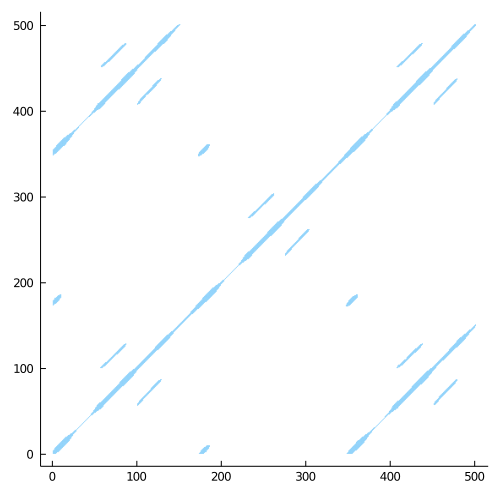

In [8]:
scatter(x,y, markersize=0.2, alpha=0.5, 
        size=(500,500), leg=false,grid=false)

Notice that the above plot has its axis in index coordiantes. One can modify this by indexing the time vector of the trajectory which is by default `0:dt:t`

In [9]:
tvec = 0:dt:t

0.0:0.01:5.0

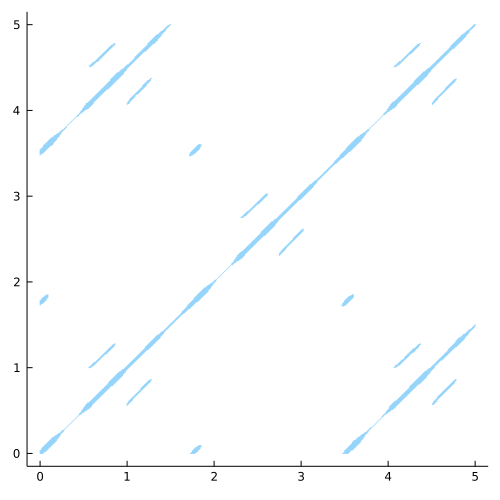

In [10]:
scatter(tvec[x], tvec[y], 
        markersize=0.2, alpha=0.5, 
        size=(500,500), leg=false,grid=false)

# C. Typical Recurrence Plots

In the previous notebook we explored the Lorentz system in a regular and chaotic regime. Here is a comparision of a recurrence plot of the lorentz system in these two regimes

#### for periodic regime

#### for chaotic regime

In [23]:

# trajectory
lor = Systems.lorenz()
set_parameter!(lor, 2, 28.0)
t,dt = 20.0, 0.02
tr = trajectory(lor, t;dt=dt, Ttr=2000.0)
p1 = plot(tr[:,1],tr[:,3])

# recurrence plot
ε = 5.0
R = RecurrenceMatrix(tr, ε)
x,y = coordinates(R)
tvec= 0:dt:t
p2 = scatter(tvec[x], tvec[y])

plot(p1,p2,layout=(1,2),legend = false)

GKS: Rectangle definition is invalid in routine SET_VIEWPORT
GKS: Rectangle definition is invalid in routine SET_VIEWPORT


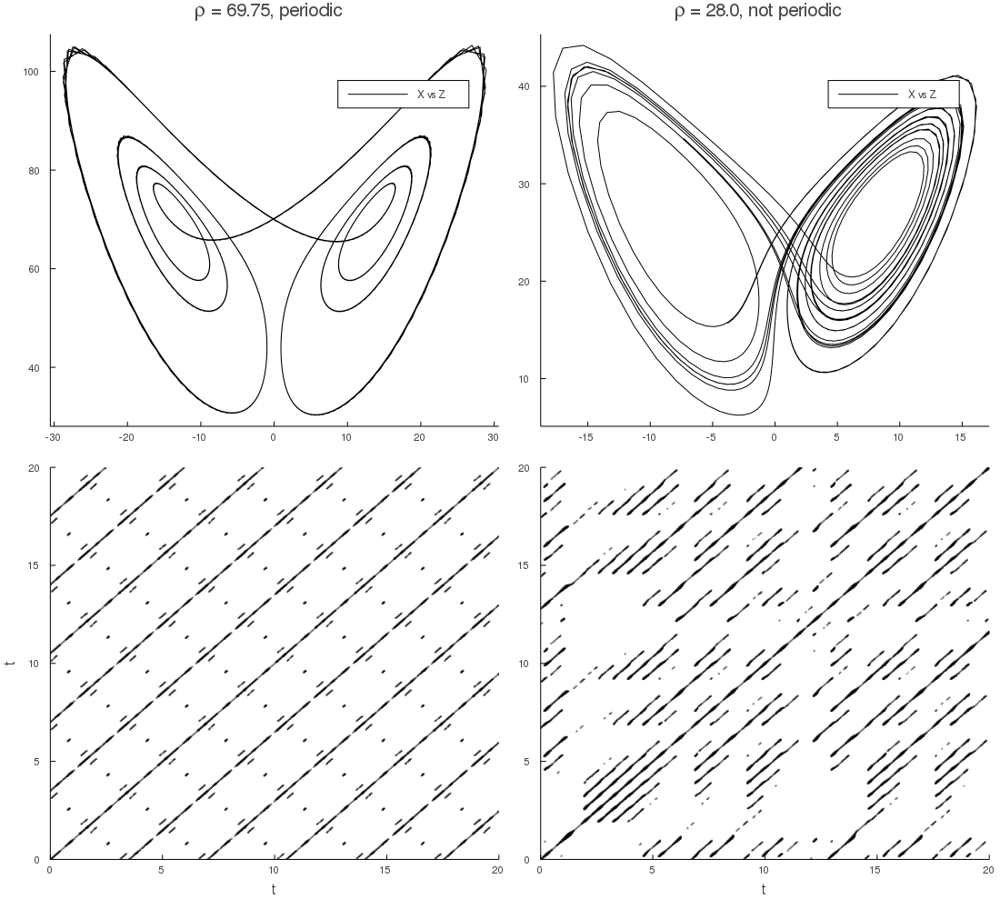

A shown above in the left image we see long()potentially infinite) diagonals repeated for different times. This is the case for periodic systems as they visit exactly the same area on the phase space again and again. The vertical distance between the offset diagonals also cooincides with the periodicity of teh system which is around $t \approx 4$

On the right we see a structure typical of chaotic motion on a strance attractor such as the one of the lorent system: th orbit visits neighborhods of previous points but then quickly diverges again. This results in many small diagonal lines. 

# D. Using recurrence matrix

Plots are great, but most of the time one needs to go further. What information can be obtained from recurrence matrices?

There area  lot of measures that one can compute from a recurrence matrix. too manx in fact, so for this notebook we will consider only a few of them:
* determinism
* maximum diagonal line length
* average diagonal line length 
* divergence 

In [24]:
RQA = rqa(R, theiler=10, lmin=5)

(RR = 0.07897692132417565, TRANS = 0.6583970958763966, DET = 0.9805255023183925, L = 19.25341426403642, Lmax = 241, DIV = 0.004149377593360996, ENTR = 3.513496236571009, TREND = -0.0025376578516935087, LAM = 0.7685342606903658, TT = 7.4076970825574175, Vmax = 18, VENTR = 1.9904338715729506, MRT = 66.70567999388426, RTE = 3.589752128549911, NMPRT = 1357)

In [26]:
RQA.Lmax

241

In [28]:
RQA.L

19.25341426403642

In [29]:
RQA.DET

0.9805255023183925

In [30]:
RQA.DIV/dt

0.20746887966804978

In [31]:
lor = Systems.lorenz()
for (i, ρ) in enumerate((69.75, 28.0))
    println("\nρ = $ρ ")
    set_parameter!(lor, 2, ρ)
    t, dt = 20.0, 0.01
    tr = trajectory(lor, t; dt = dt, Ttr = 200.0)
    
    ε = i == 1 ? 5.0 : 3.0
    R = RecurrenceMatrix(tr, ε)
    
    RQA = rqa(R, theiler = 10, lmin = 5)

    println("maximum diagonal: ", RQA.Lmax)
    println("average diagonal: ", RQA.L)
    println("determinism: ", RQA.DET)
    println("divergence (t-units): ", RQA.DIV/dt)
end


ρ = 69.75 
maximum diagonal: 1650
average diagonal: 32.21234119782214
determinism: 0.992895502349519
divergence (t-units): 0.06060606060606061

ρ = 28.0 
maximum diagonal: 275
average diagonal: 29.40611075747931
determinism: 0.9956679167205483
divergence (t-units): 0.36363636363636365


* For periodic systems the maximum and average diagonals are not really meaningfull quantities. Their true values are inf
* In the chaotic regime the average and maximum diagonal length both serve as an estimate of the divergence of nearby trajectories
* Determinism simply measures the portion ofdiagonal lines in teh recrrence plot. It can be interpreted as teh predictablility of the trajectory, in the sense that approximately close states should have approximately similar future for small times.
* Divergence is equal to 1/(maximum diagonal). It is just a measure for how fast do trajectories diverge. Again for the periodic system we know that it theoritically shoulld be zero

### A Final Example: Laminarity

Besides these daigonal lines, there are other things that may show up in a recurrence plot, given a different rajectory. An example is vertical lines, which appear in the intermittent sysems.

For example it is knon tha the logistic map is intermittent just before the period 3 window, so let us look at its recurrence plot

In [32]:
logi = Systems.logistic(0.5;r=3.828)

1-dimensional discrete dynamical system
 state:       0.5
 e.o.m.:      logistic_eom
 in-place?    false
 jacobian:    logistic_jacob
 parameters:  [3.828]

In the following we will use the third iterate of the logistic map (because laminar phases are of phases three)

In [33]:
x3 = trajectory(logi, 400; dt = 3) #every third point with dt = 3

Rlogi = RecurrenceMatrix(x3, 0.1)
x,y = coordinates(Rlogi)

([1, 1, 1, 1, 1, 1, 1, 1, 1, 1  …  134, 134, 134, 134, 134, 134, 134, 134, 134, 134], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  78, 94, 100, 128, 129, 130, 131, 132, 133, 134])

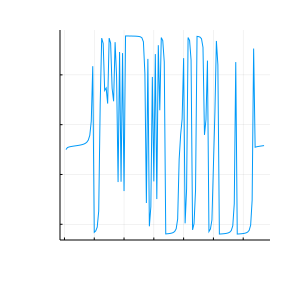

GKS: Rectangle definition is invalid in routine SET_VIEWPORT


In [37]:
plot(x3, size=(300,300))

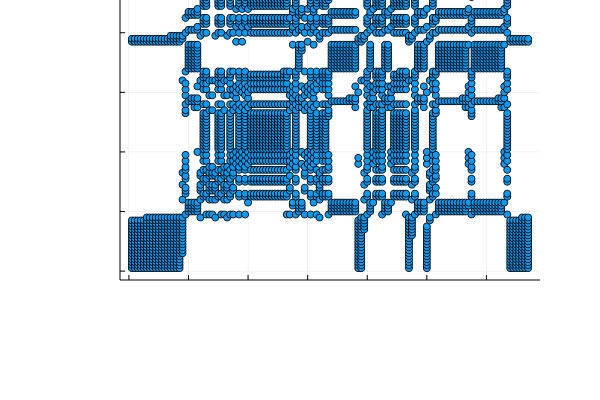

GKS: Rectangle definition is invalid in routine SET_VIEWPORT


In [38]:
scatter(x,y)

Laminarity is a function that counts the portion of he vertical lines in the recurrence plot

In [39]:
laminarity(Rlogi)

0.8034605732399949

This number tells us how big of a portion is spend in a "laminar" phase. Equivalently how much portion of the trajectory is spend around a constant number +/- $\varepsilon$